<a href="https://colab.research.google.com/github/abhinavdayal/DepthMask/blob/master/S15Assignment_attempt1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [1]:
import os
from getpass import getpass
password = getpass('abhinavdayal')
os.environ['GITHUB_AUTH'] = 'abhinavdayal:'+password

!git clone https://$GITHUB_AUTH@github.com/abhinavdayal/EVA4_LIBRARY.git

abhinavdayal··········
Cloning into 'EVA4_LIBRARY'...
remote: Enumerating objects: 192, done.
remote: Counting objects: 100% (192/192), done.
remote: Compressing objects: 100% (108/108), done.
remote: Total 336 (delta 97), reused 174 (delta 82), pack-reused 144
Receiving objects: 100% (336/336), 58.64 KiB | 690.00 KiB/s, done.
Resolving deltas: 100% (164/164), done.


In [0]:
import sys

In [0]:
rm -rf /content/EVA4_LIBRARY/

In [0]:
# Execute this only to unload the eva4 library in case of any changes
import pathlib
for p in pathlib.Path('./EVA4_LIBRARY').rglob('*.py[co]'):
  p.unlink()
for p in pathlib.Path('./EVA4_LIBRARY').rglob('__pycache__'):
  p.rmdir()
m = []
for k in sys.modules:
  if k.startswith('eva4'):
    m.append(k)

for k in m:
    del sys.modules[k]

In [0]:
sys.path.append("/content/EVA4_LIBRARY/EVA4")

In [4]:
from google.colab import drive
drive.mount('drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at drive


# Dataset and Creating Train/Test Split

Get the imagenet dataset

In [5]:
import time
start=time.time()
from zipfile import ZipFile
# Create a ZipFile Object and load sample.zip in it
with ZipFile('/content/drive/My Drive/S15A/out2.zip', 'r') as zipObj:
# Extract all the contents of zip file in current directory
  zipObj.extractall()
print(time.time()-start)

247.42462253570557


## Data collection and Prep

Get the Albumentations library

In [6]:
!pip install -U git+https://github.com/albu/albumentations > /dev/null && echo "All libraries are successfully installed!"

  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-mqy_m35p
All libraries are successfully installed!


## Data Transformations

We first start with defining our data transformations. 

* random brightness contrast


In [0]:
import cv2
import numpy as np
from eva4datatransforms import AlbumentationTransforms
import albumentations as A
from torchvision import transforms

# The values here are elsewhere calculated
channel_means = ( 0.50610699, 0.5250236, 0.51219183 )
channel_stdevs = ( 0.28525343, 0.24801724, 0.24747186 )

# Train Phase transformations

image_transforms = AlbumentationTransforms([
                                      A.RandomBrightnessContrast(),
                                      A.Resize(80, 80),
                                      A.Normalize(mean=channel_means, std=channel_stdevs),
                                    ])
target_transforms = AlbumentationTransforms([
                                      A.Resize(80, 80),
                                      A.Normalize(mean=0, std=1),
                                    ])

fillmeans = (np.array(channel_means)).astype(np.uint8)

# Test Phase transformations
#test_transforms = AlbumentationTransforms([A.Normalize(mean=channel_means, std=channel_stdevs)])
test_transforms = AlbumentationTransforms([
                                      A.Resize(80, 80),
                                      A.Normalize(mean=channel_means, std=channel_stdevs),
                                    ])


## Get Dataset
Create 70/30 split after combining train/test
We have separately calculated the mean/std or we can use 0.5s

In [0]:
from eva4datasets import fgbgdata

train_data, test_data = fgbgdata.fgbg_test_train('/content/out2', 0.8, 0.1)
train = fgbgdata.FGBGDataset(train_data, image_transforms, target_transforms, target_transforms)
test = fgbgdata.FGBGDataset(test_data, test_transforms, target_transforms, target_transforms)

# Dataloader Arguments & Test/Train Dataloaders


In [0]:
import eva4dataloaders
batch_size=256

dataloader = eva4dataloaders.DataLoader(batch_size=batch_size, shuffle=True)

# train dataloader
train_loader = dataloader.load(train)

# test dataloader
test_loader = dataloader.load(test)

In [0]:
images, outcomes = iter(train_loader).next()

In [0]:
from torch.utils.tensorboard import SummaryWriter # TensorBoard support
tb = SummaryWriter(comment='Test')
import torchvision
visdecoder = {'masks':1, 'depths':2}
l = 0
for k, v in visdecoder.items():
    vgrid = torchvision.utils.make_grid(outcomes[:32,l:v,:,:])
    l = v
    tb.add_image(k, vgrid)

# Data Statistics

It is important to know your data very well. Let's check some of the statistics around our data and how it actually looks like

In [0]:
%load_ext tensorboard

In [0]:
!kill 6919

In [27]:
%tensorboard --logdir '/content/drive/My Drive/S15/runs'

<IPython.core.display.Javascript object>

# Model Creation

We will be calling ResNet18 model here.

In [26]:
from eva4models.s15net import S15Net
import torch

def init_weights(m):
    if str(type(m)).startswith('torch.nn.modules.conv') :
      torch.nn.init.kaiming_normal_(m.weight, a=0, mode='fan_in', nonlinearity='leaky_relu')

model = S15Net(planes=16)
model.apply(init_weights)

use_cuda = torch.cuda.is_available()
model.device = torch.device("cuda" if use_cuda else "cpu")
model.to(model.device)
model.summary((3,80, 80))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 80, 80]             432
       BatchNorm2d-2           [-1, 16, 80, 80]              32
            Conv2d-3           [-1, 32, 80, 80]           4,608
       BatchNorm2d-4           [-1, 32, 80, 80]              64
            Conv2d-5           [-1, 64, 40, 40]          18,432
       BatchNorm2d-6           [-1, 64, 40, 40]             128
      InitialBlock-7           [-1, 64, 40, 40]               0
            Conv2d-8           [-1, 16, 40, 40]           1,024
       BatchNorm2d-9           [-1, 16, 40, 40]              32
           Conv2d-10           [-1, 32, 40, 40]           4,608
      BatchNorm2d-11           [-1, 32, 40, 40]              64
           Conv2d-12           [-1, 64, 40, 40]          18,432
      BatchNorm2d-13           [-1, 64, 40, 40]             128
         ResBlock-14           [-1, 64,

In [0]:
model

S15Net(
  (prepLayer): InitialBlock(
    (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (layer1): ResBlock(
    (conv1): Conv2d(64, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(2, 2), dilation=(2, 2), bias=False)
    (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(32, 64,

In [0]:
import runbuilder
m = runbuilder.RunManager('/content/drive/My Drive/S15', channel_means, channel_stdevs, classification=False, visdecoder={'mask':1, 'depth':2})

## LR Finder

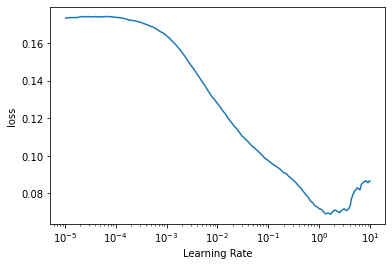

1.7060823890031256

In [20]:
import torch.nn as nn
import torch.nn.functional as F
from eva4LRFinder2 import LRRangeFinder
import torch.optim as optim
L1lambda = 0
L2lambda = 1e-4
criterion = nn.MSELoss()
optimizer = optim.SGD(model.parameters(), lr=1e-5) #optim.Adam(model.parameters(), lr=1e-5, weight_decay=L2lambda) # 
lr_finder = LRRangeFinder(model, optimizer, criterion, 3, 1e-5, 10, train_loader)
lr_finder.range_test()

# Training and Testing

Looking at logs can be boring, so we'll introduce **tqdm** progressbar to get cooler logs. 

Let's write train and test functions using One Cycle Policy Scheduler. We use final_div_factor = 1 so as there is no annihilation.

In [35]:
import torch.optim as optim
import torch.nn as nn
import torch

L1lambda = 0
L2lambda = 0
EPOCHS = 5
optimizer = optim.SGD(model.parameters(), lr=0.08, momentum=0.9, nesterov=True, weight_decay=L2lambda)
torch.autograd.set_detect_anomaly(True)
model.trainTensorboard(optimizer, train_loader, test_loader, EPOCHS, m, {'lr':0.08, 'loss':'MSELoss'}, nn.MSELoss())

cuda
initialized trainer with  cuda
initialized tester with  cuda



OrderedDict([('run', 7), ('epoch', 31), ('train loss', 0.012347083941102028), ('test loss', 0.012593570619821548), ('epoch duration', 109.59271001815796), ('run duration', 113.85050463676453), ('lr', 0.08), ('loss', 'MSELoss')])
Learning Rate = 0.080000



OrderedDict([('run', 7), ('epoch', 32), ('train loss', 0.01231170043349266), ('test loss', 0.012605051696300506), ('epoch duration', 108.70277667045593), ('run duration', 223.1209752559662), ('lr', 0.08), ('loss', 'MSELoss')])
Learning Rate = 0.080000



OrderedDict([('run', 7), ('epoch', 33), ('train loss', 0.0122793388068676), ('test loss', 0.012598293125629425), ('epoch duration', 109.20509099960327), ('run duration', 332.8900058269501), ('lr', 0.08), ('loss', 'MSELoss')])
Learning Rate = 0.080000



OrderedDict([('run', 7), ('epoch', 34), ('train loss', 0.012293513827025891), ('test loss', 0.012607371062040329), ('epoch duration', 109.64462423324585), ('run duration', 443.1145942211151), ('lr', 0.08), ('loss', 'MSELoss')])
Learning Rate = 0.080000



OrderedDict([('run', 7), ('epoch', 35), ('train loss', 0.012281325124204158), ('test loss', 0.012602785378694534), ('epoch duration', 109.74004673957825), ('run duration', 553.3882417678833), ('lr', 0.08), ('loss', 'MSELoss')])
Learning Rate = 0.080000

